# Faster RCNN


## 載入套件


In [1]:
from typing import List, Tuple

import cv2
import matplotlib.pyplot as plt
import torch
from torchvision import models, transforms

from PIL import Image

## 檢查 GPU


In [2]:
device = "cuda" if torch.cuda.is_available() else "mps" if torch.mps.is_available() else "cpu"
device

'mps'

In [3]:
device = "cpu"

## 載入模型


In [4]:
model = models.detection.fasterrcnn_resnet50_fpn(weights=models.detection.FasterRCNN_ResNet50_FPN_Weights.DEFAULT).to(
    device
)
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

## COCO 資料集類別


In [5]:
COCO_INSTANCE_CATEGORY_NAMES = [
    '__background__',
    'person',
    'bicycle',
    'car',
    'motorcycle',
    'airplane',
    'bus',
    'train',
    'truck',
    'boat',
    'traffic light',
    'fire hydrant',
    'N/A',
    'stop sign',
    'parking meter',
    'bench',
    'bird',
    'cat',
    'dog',
    'horse',
    'sheep',
    'cow',
    'elephant',
    'bear',
    'zebra',
    'giraffe',
    'N/A',
    'backpack',
    'umbrella',
    'N/A',
    'N/A',
    'handbag',
    'tie',
    'suitcase',
    'frisbee',
    'skis',
    'snowboard',
    'sports ball',
    'kite',
    'baseball bat',
    'baseball glove',
    'skateboard',
    'surfboard',
    'tennis racket',
    'bottle',
    'N/A',
    'wine glass',
    'cup',
    'fork',
    'knife',
    'spoon',
    'bowl',
    'banana',
    'apple',
    'sandwich',
    'orange',
    'broccoli',
    'carrot',
    'hot dog',
    'pizza',
    'donut',
    'cake',
    'chair',
    'couch',
    'potted plant',
    'bed',
    'N/A',
    'dining table',
    'N/A',
    'N/A',
    'toilet',
    'N/A',
    'tv',
    'laptop',
    'mouse',
    'remote',
    'keyboard',
    'cell phone',
    'microwave',
    'oven',
    'toaster',
    'sink',
    'refrigerator',
    'N/A',
    'book',
    'clock',
    'vase',
    'scissors',
    'teddy bear',
    'hair drier',
    'toothbrush',
]

len(COCO_INSTANCE_CATEGORY_NAMES)

91

# 定義預測函數


In [6]:
def get_prediction(img_path: str, threshold: float) -> Tuple[List[List[Tuple[int, int]]], List[str]]:
    # 讀取圖檔
    img = Image.open(img_path)
    # 預測
    transform = transforms.Compose([transforms.ToTensor()])
    img = transform(img)
    pred = model([img])
    # 取得預測類別、定界框(bounding box)及分數
    pred_class = [COCO_INSTANCE_CATEGORY_NAMES[i] for i in list(pred[0]['labels'].numpy())]
    pred_boxes = [[(int(i[0]), int(i[1])), (int(i[2]), int(i[3]))] for i in list(pred[0]['boxes'].detach().numpy())]
    pred_score = list(pred[0]['scores'].detach().numpy())

    # 篩選超過門檻值的框
    pred_t = [pred_score.index(x) for x in pred_score if x > threshold][-1]
    pred_boxes = pred_boxes[: pred_t + 1]
    pred_class = pred_class[: pred_t + 1]
    return pred_boxes, pred_class

## 定義物件偵測的 API


In [7]:
def object_detection_api(img_path, threshold=0.5, rect_th=3, text_size=2, text_th=2):
    # 預測
    boxes, pred_cls = get_prediction(img_path, threshold)

    # 畫框
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for i in range(len(boxes)):
        cv2.rectangle(img, boxes[i][0], boxes[i][1], color=(0, 255, 0), thickness=rect_th)
        cv2.putText(
            img,
            pred_cls[i],
            (boxes[i][0][0], boxes[i][0][1] - 10),
            cv2.FONT_HERSHEY_SIMPLEX,
            text_size,
            (0, 255, 0),
            thickness=text_th,
        )
    plt.figure(figsize=(20, 30))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

# 測試


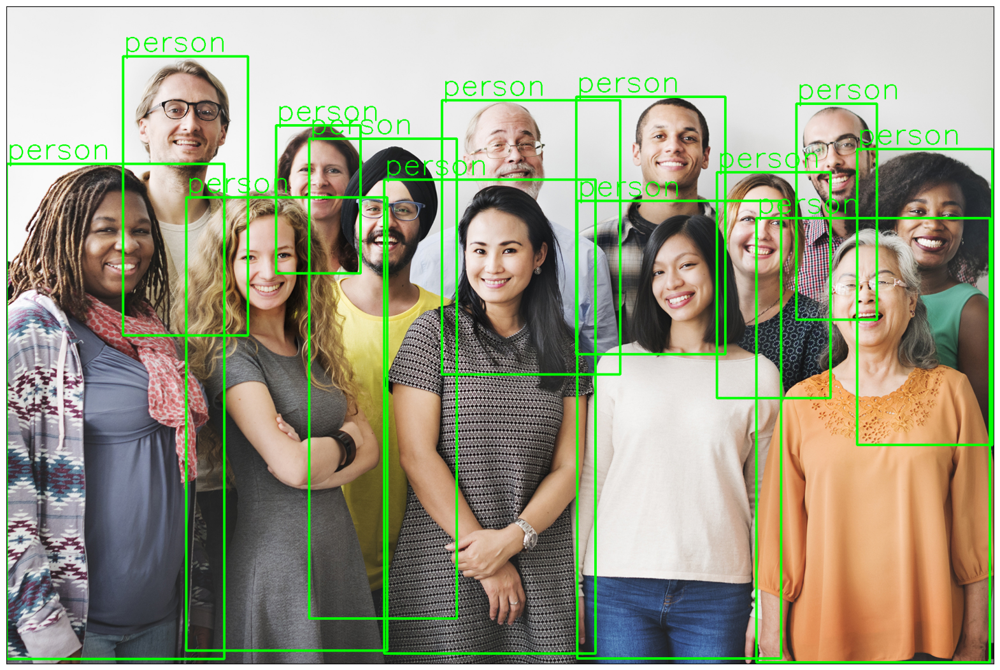

In [8]:
# 呼叫物件偵測的 API
object_detection_api('images_Object_Detection/people.jpg', threshold=0.8)

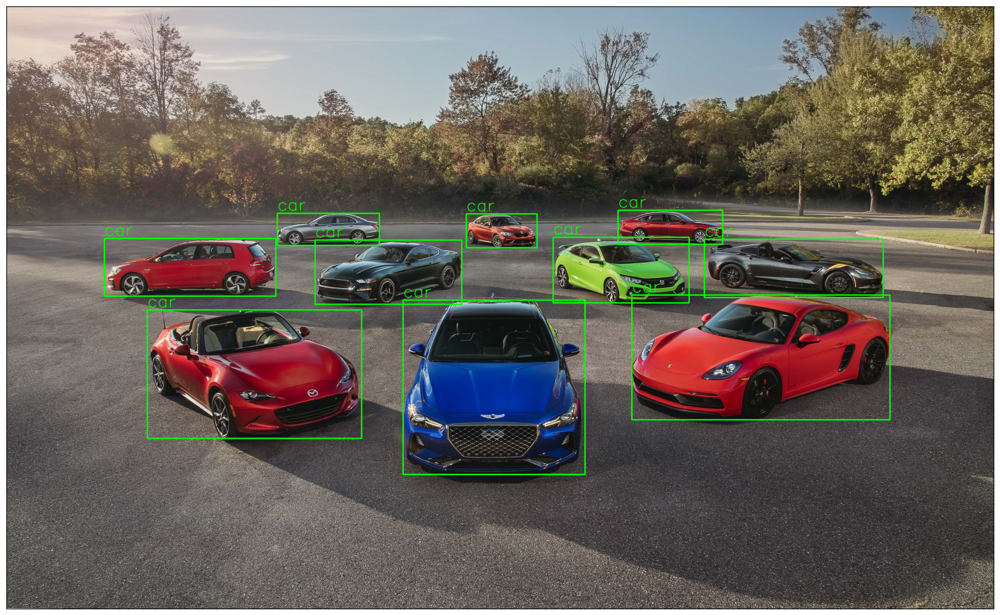

In [9]:
# 呼叫物件偵測的 API
object_detection_api('images_Object_Detection/car.jpg', threshold=0.8)

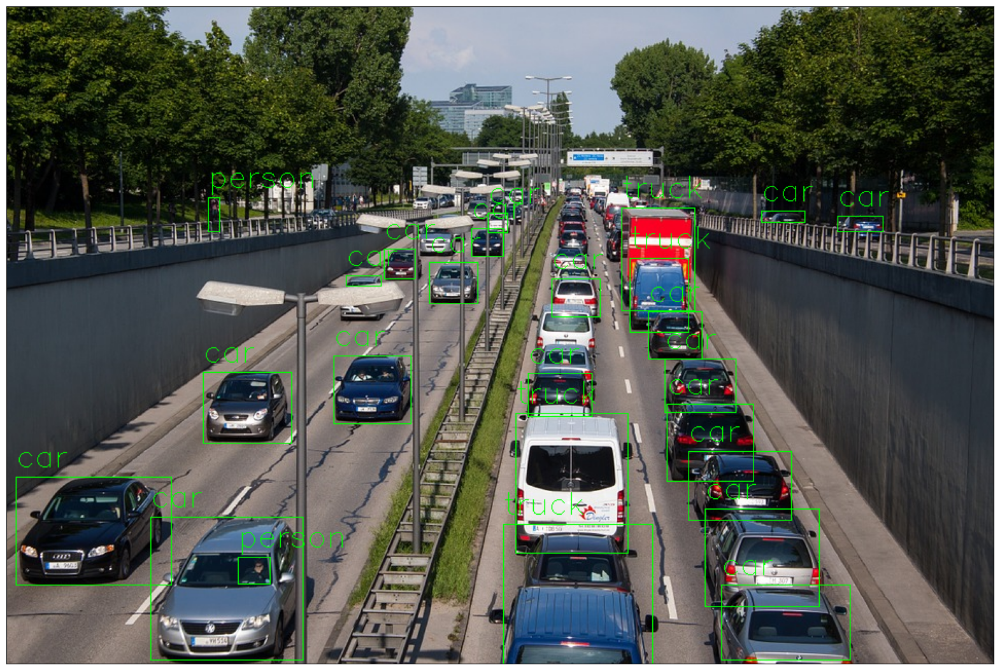

In [10]:
# 呼叫物件偵測的 API
object_detection_api('images_Object_Detection/traffic_scene.jpg', threshold=0.8, rect_th=1, text_size=1, text_th=1)